In [1]:
!pwd

/kaggle/working


# Imports

In [2]:
import numpy as np

import tensorflow as tf

from PIL import Image

import random

import matplotlib.pyplot as plt

import math

# Input shape of the model

In [3]:
input_shape=(64,64,3)

input_size=input_shape[0]*input_shape[1]*input_shape[2]

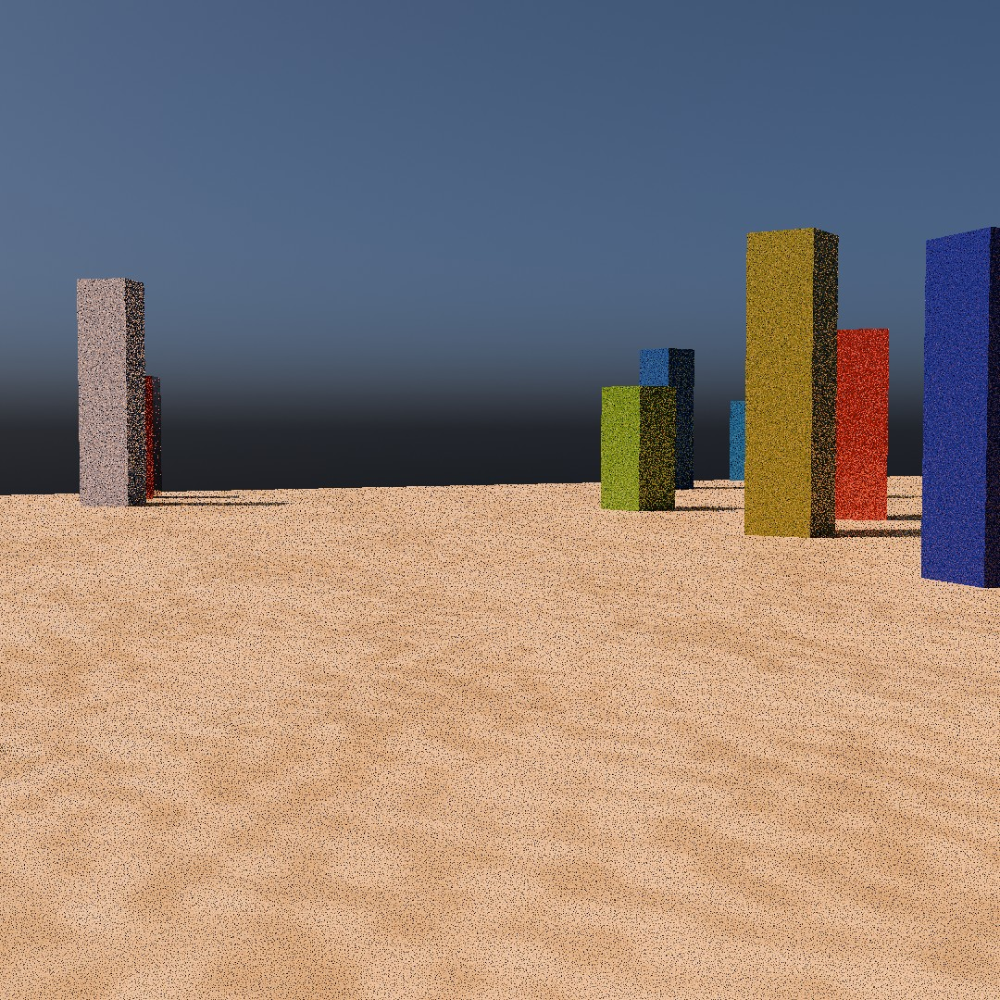

In [4]:


img=Image.open("/kaggle/input/raytracing/dataset2/noise/img2.jpg")

# img.crop((200,200,200input_shape[0],input_shape[1]))

# img.resize((input_shape[0],input_shape[1]))

img

# data loaders

In [5]:
data_dir="/kaggle/input/raytracing/"

In [6]:
def PIL_to_data(data):

  out=data.astype('float')/255.0

  return out

def data_to_PIL(data):

  out=(data*255.0).astype('uint8')

  return out

In [7]:
class DataLoader():

  def __init__(self,data_dir,image_shape):

    self.data_dir=data_dir

    self.image_shape=image_shape

    self.x=[]

    self.y=[]

  def load(self,offset,n):

    self.x=[]

    self.y=[]

    cropx=50

    cropy=500

    for i in np.arange(offset,offset+n):

      noiseimg=Image.open(self.data_dir+"/noise/img"+str(i)+".jpg")

      noiseimg=noiseimg.crop((cropx,cropy,cropx+self.image_shape[0],cropy+self.image_shape[1]))

      denoiseimg=Image.open(self.data_dir+"/denoise/img"+str(i)+".jpg")

      denoiseimg=denoiseimg.crop((cropx,cropy,cropx+self.image_shape[0],cropy+self.image_shape[1]))

      self.x.append(PIL_to_data(np.array(noiseimg)))

      self.y.append(PIL_to_data(np.array(denoiseimg)))

    return (np.array(self.x),np.array(self.y))

In [8]:
class RanCropDataLoader(DataLoader):

  def __init__(self,data_dir,image_shape):

    super().__init__(data_dir,image_shape)

    self.data_dir=data_dir

  def load(self,offset,n,patches_per_img=20):

    self.x=[]

    self.y=[]

    # cropx=50

    # cropy=500

    for i in np.arange(offset,offset+n):

      noiseimg=Image.open(self.data_dir+"/noise/img"+str(i)+".jpg")

      denoiseimg=Image.open(self.data_dir+"/denoise/img"+str(i)+".jpg")

      for j in np.arange(0,patches_per_img):

        imgx=random.randint(0,noiseimg.size[0]-self.image_shape[0])

        imgy=random.randint(0,noiseimg.size[1]-self.image_shape[1])

        # noiseimg=noiseimg.resize((input_shape[0],input_shape[1]))

        noisepatch=noiseimg.crop((imgx,imgy,imgx+self.image_shape[0],imgy+self.image_shape[1]))

        # denoiseimg=denoiseimg.resize((input_shape[0],input_shape[1]))

        denoisepatch=denoiseimg.crop((imgx,imgy,imgx+self.image_shape[0],imgy+self.image_shape[1]))

        # print(np.array(noiseimg).shape)

        self.x.append(PIL_to_data(np.array(noisepatch)))#.reshape(input_size)

        self.y.append(PIL_to_data(np.array(denoisepatch)))

    return (np.array(self.x),np.array(self.y))

In [9]:
def load_data_test(n):

  cropx=50

  cropy=500

  x=[]

  y=[]

  for i in np.arange(n):

    noiseimg=Image.open("dataset2/noise/img"+str(i)+".jpg")

    # noiseimg=noiseimg.resize((input_shape[0],input_shape[1]))

    noiseimg=noiseimg.crop((cropx,cropy,cropx+input_shape[0],cropy+input_shape[1]))

    denoiseimg=Image.open("dataset2/denoise/img"+str(i)+".jpg")

    # denoiseimg=denoiseimg.resize((input_shape[0],input_shape[1]))

    denoiseimg=denoiseimg.crop((cropx,cropy,cropx+input_shape[0],cropy+input_shape[1]))

    # print(np.array(noiseimg).shape)

    x.append(PIL_to_data(np.array(noiseimg)))#.reshape(input_size)

    y.append(PIL_to_data(np.array(denoiseimg)))

    # noiseimg.to

    # x.append(noiseimg)

    # y.append(denoiseimg)

  return (np.array(x),np.array(y))


(8000, 64, 64, 3)


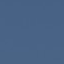

In [11]:
loader=RanCropDataLoader(data_dir+"dataset2",input_shape)

x,y=loader.load(0,80,100)

# x,y=load_data_test(80)

print(x.shape)

Image.fromarray(data_to_PIL(y[20]))

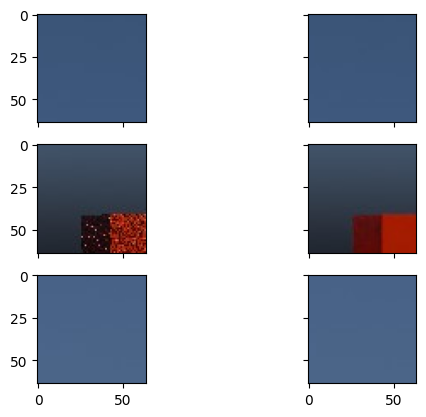

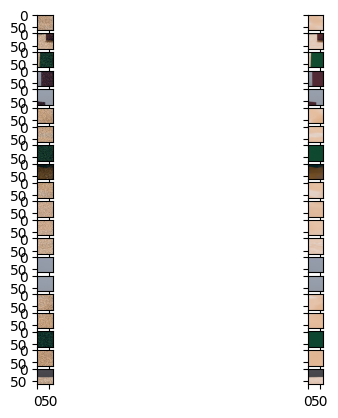

In [12]:


def display(offset,n,x,y,pred=None):

  t=2 if pred is None else 3

  fig,ax=plt.subplots(n,t,sharex=True,sharey=True)

  for i in np.arange(n):

    ax[i,0].imshow(Image.fromarray(data_to_PIL(np.array(x[offset+i]))))

    ax[i,1].imshow(Image.fromarray(data_to_PIL(np.array(y[offset+i]))))

    # ax[i,1].imshow(Image.fromarray(np.array(y[offset+i]*255.0).astype('uint8')))

    if pred is not None:

      ax[i,2].imshow(Image.fromarray(data_to_PIL(np.array(pred[offset+i]))))

  plt.show()

display(50,3,x,y)

display(100,20,x,y)

In [37]:
class DEno(tf.keras.Model):

  def __init__(self,image_shape):

    super().__init__()

    self.image_shape=image_shape

    self.input_shape=(None,)+tuple(image_shape)

    self.model=tf.keras.Sequential()

    self.model.add(tf.keras.Input((image_shape)))

    self.model.add(tf.keras.layers.Conv2D(16,(5,5),activation='relu'))

    self.model.add(tf.keras.layers.Dropout(0.01))

    # self.model.add(tf.keras.layers.)

    self.model.add(tf.keras.layers.Conv2DTranspose(3,(5,5),activation=tf.keras.activations.sigmoid))

    # self.compile(tf.keras.optimizers.Adam(0.001),loss=tf.keras.losses.MeanAbsoluteError)

    # self.model.summary()

  def __call__(self,inputs):

    return self.model.__call__(inputs)

  def summary(self):

    input_layer=tf.keras.Input((self.image_shape))

    # x=self.input_layer(x)

    model=tf.keras.Model([input_layer],self.__call__(input_layer))

    return model.summary()




In [13]:
class DEno1(tf.keras.Model):

  def __init__(self,image_shape):

    super(DEno1,self).__init__()

    input_shape=list(image_shape)

    input_shape.insert(0,None)

    self.image_shape=image_shape

    self.input_shape=tuple(input_shape)

    # self.

    self.layer1=tf.keras.layers.Conv2D(16,(5,5),activation='relu')

    self.layer2=tf.keras.layers.Dropout(0.1)

    self.layer3=tf.keras.layers.Conv2DTranspose(3,(5,5),activation=tf.keras.activations.sigmoid)

    # self.layer3=tf.keras.layers.Conv2DTranspose(3,(5,5),activation=tf.keras.activations.sigmoid)



    # self.model.add(tf.keras.layers.)

    self.compile(tf.keras.optimizers.Adam(0.001),loss=tf.keras.losses.MeanSquaredLogarithmicError)

    # self.summary()

  def __call__(self,x):

    # x=self.input_layer(x)

    x=self.layer1(x)

    x=self.layer2(x)

    x=self.layer3(x)

    return x

  def summary(self):

    input_layer=tf.keras.Input((self.image_shape))

    # x=self.input_layer(x)

    model=tf.keras.Model([input_layer],self.__call__(input_layer))

    return model.summary()




In [14]:
class UNet(tf.keras.Model):

    def __init__(self, image_shape, init_features=32):

        super(UNet, self).__init__()

        self.image_shape=image_shape

        features = init_features

        self.encoder1 = UNet._block(features, name="enc1")

        # print("fff")

        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder2 = UNet._block( features * 2, name="enc2")

        self.pool2 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder3 = UNet._block( features * 4, name="enc3")

        self.pool3 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder4 = UNet._block( features * 8, name="enc4")

        self.pool4 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)



        self.bottleneck = UNet._block( features * 16, name="bottleneck")



        self.upconv4 = tf.keras.layers.Conv2DTranspose( features * 8, kernel_size=2, strides=2)

        self.decoder4 = UNet._block( features * 8, name="dec4")

        self.upconv3 = tf.keras.layers.Conv2DTranspose(features * 4, kernel_size=2, strides=2)

        self.decoder3 = UNet._block( features * 4, name="dec3")

        self.upconv2 = tf.keras.layers.Conv2DTranspose( features * 2, kernel_size=2, strides=2)

        self.decoder2 = UNet._block( features * 2, name="dec2")

        self.upconv1 = tf.keras.layers.Conv2DTranspose( features, kernel_size=2, strides=2)

        self.decoder1 = UNet._block( features, name="dec1")



        self.conv = tf.keras.layers.Conv2D( image_shape[2], kernel_size=1)

    def summary(self):

        input_layer=tf.keras.Input(self.image_shape)

        model=tf.keras.Model(inputs=[input_layer],outputs=self.__call__(input_layer))

        return model.summary()

    def __call__(self, x):

        enc1 = self.encoder1(x)

        enc2 = self.encoder2(self.pool1(enc1))

        enc3 = self.encoder3(self.pool2(enc2))

        enc4 = self.encoder4(self.pool3(enc3))



        bottleneck = self.bottleneck(self.pool4(enc4))



        dec4 = self.upconv4(bottleneck)

        dec4 = self.pad_to_match(dec4, enc4)

        # print("look",tf.keras.backend.int_shape(enc4)[1:])

        # print("look",tf.keras.backend.int_shape(dec4)[1:])

        dec4 = tf.keras.layers.Concatenate(3)((dec4, enc4))

        # print("look",tf.keras.backend.int_shape(dec4)[1:])

        dec4 = self.decoder4(dec4)



        dec3 = self.upconv3(dec4)

        # print("look",tf.keras.backend.int_shape(dec3)[1:])

        dec3 = self.pad_to_match(dec3, enc3)

        dec3 = tf.keras.layers.Concatenate(3)((dec3, enc3))

        dec3 = self.decoder3(dec3)



        dec2 = self.upconv2(dec3)

        dec2 = self.pad_to_match(dec2, enc2)

        dec2 = tf.keras.layers.Concatenate(3)((dec2, enc2))

        dec2 = self.decoder2(dec2)



        dec1 = self.upconv1(dec2)

        dec1 = self.pad_to_match(dec1, enc1)

        dec1 = tf.keras.layers.Concatenate(3)((dec1, enc1))

        dec1 = self.decoder1(dec1)



        return tf.keras.activations.sigmoid(self.conv(dec1))

    @staticmethod

    def _block( features, name):



        return tf.keras.Sequential(

            (tf.keras.layers.Conv2D(features, kernel_size=3, padding="same", use_bias=False),

            tf.keras.layers.BatchNormalization(),

            tf.keras.layers.ReLU(),

            tf.keras.layers.Conv2D(features, kernel_size=3, padding="same", use_bias=False),

            tf.keras.layers.BatchNormalization(),

            tf.keras.layers.ReLU())

        )



    @staticmethod

    def pad_to_match(layer, target_layer):

        # print(tf.keras.backend.int_shape(target_layer)[1:-1])

        # print(tf.keras.backend.int_shape(layer)[1:-1])

        target_height, target_width = tf.keras.backend.int_shape(target_layer)[1:-1]

        layer_height, layer_width = tf.keras.backend.int_shape(layer)[1:-1]



        diff_y = target_height - layer_height

        diff_x = target_width - layer_width



        padding = ( (0,0),(0,diff_x), (0,diff_y),(0,0))

        layer = tf.keras.ops.pad(layer, padding, "constant", 0)

        # print("hggh",tf.keras.backend.int_shape(layer)[1:-1],padding)



        return layer


In [15]:
class UNetv2(tf.keras.Model):

    def __init__(self, image_shape, init_features=32):

        super(UNetv2, self).__init__()

        self.image_shape=image_shape

        features = init_features

        self.encoder1 = UNet._block(features, name="enc1")

        # print("fff")

        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder2 = UNet._block( features * 2, name="enc2")

        self.pool2 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder3 = UNet._block( features * 4, name="enc3")

        self.pool3 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)

        self.encoder4 = UNet._block( features * 8, name="enc4")

        self.pool4 = tf.keras.layers.MaxPool2D(pool_size=2, strides=2)



        self.bottleneck = UNet._block( features * 16, name="bottleneck")



        self.upconv4 = tf.keras.layers.Conv2DTranspose( features * 8, kernel_size=2, strides=2)

        self.decoder4 = UNet._block( features * 8, name="dec4")

        self.upconv3 = tf.keras.layers.Conv2DTranspose(features * 4, kernel_size=2, strides=2)

        self.decoder3 = UNet._block( features * 4, name="dec3")

        self.upconv2 = tf.keras.layers.Conv2DTranspose( features * 2, kernel_size=2, strides=2)

        self.decoder2 = UNet._block( features * 2, name="dec2")

        self.upconv1 = tf.keras.layers.Conv2DTranspose( features, kernel_size=2, strides=2)

        self.decoder1 = UNet._block( features, name="dec1")



        self.conv = tf.keras.layers.Conv2D( image_shape[2], kernel_size=1)

    def summary(self):

        input_layer=tf.keras.Input(self.image_shape)

        model=tf.keras.Model(inputs=[input_layer],outputs=self.__call__(input_layer))

        return model.summary()

    def __call__(self, x):

        enc1 = self.encoder1(x)

        enc2 = self.encoder2(self.pool1(enc1))

        enc3 = self.encoder3(self.pool2(enc2))

        enc4 = self.encoder4(self.pool3(enc3))



        bottleneck = self.bottleneck(self.pool4(enc4))



        dec4 = self.upconv4(bottleneck)

        dec4 = self.pad_to_match(dec4, enc4)

        # print("look",tf.keras.backend.int_shape(enc4)[1:])

        # print("look",tf.keras.backend.int_shape(dec4)[1:])

        dec4 = tf.keras.layers.Concatenate(3)((dec4, enc4))

        # print("look",tf.keras.backend.int_shape(dec4)[1:])

        dec4 = self.decoder4(dec4)



        dec3 = self.upconv3(dec4)

        # print("look",tf.keras.backend.int_shape(dec3)[1:])

        dec3 = self.pad_to_match(dec3, enc3)

        dec3 = tf.keras.layers.Concatenate(3)((dec3, enc3))

        dec3 = self.decoder3(dec3)



        dec2 = self.upconv2(dec3)

        dec2 = self.pad_to_match(dec2, enc2)

        dec2 = tf.keras.layers.Concatenate(3)((dec2, enc2))

        dec2 = self.decoder2(dec2)



        dec1 = self.upconv1(dec2)

        dec1 = self.pad_to_match(dec1, enc1)

        dec1 = tf.keras.layers.Concatenate(3)((dec1, enc1))

        dec1 = self.decoder1(dec1)



        return tf.keras.activations.sigmoid(self.conv(dec1))

    @staticmethod

    def _block( features, name):



        return tf.keras.Sequential(

            (tf.keras.layers.Conv2D(features, kernel_size=3,activation='relu', padding="same", use_bias=False),

            tf.keras.layers.BatchNormalization(),

            tf.keras.layers.ReLU(),

            tf.keras.layers.Conv2D(features, kernel_size=3, padding="same", use_bias=False),

            tf.keras.layers.BatchNormalization(),

            tf.keras.layers.ReLU())

        )



    @staticmethod

    def pad_to_match(layer, target_layer):

        # print(tf.keras.backend.int_shape(target_layer)[1:-1])

        # print(tf.keras.backend.int_shape(layer)[1:-1])

        target_height, target_width = tf.keras.backend.int_shape(target_layer)[1:-1]

        layer_height, layer_width = tf.keras.backend.int_shape(layer)[1:-1]



        diff_y = target_height - layer_height

        diff_x = target_width - layer_width



        padding = ( (0,0),(0,diff_x), (0,diff_y),(0,0))

        layer = tf.keras.ops.pad(layer, padding, "constant", 0)

        # print("hggh",tf.keras.backend.int_shape(layer)[1:-1],padding)



        return layer


In [104]:
class custom_loss(tf.keras.Loss):
    def call(self, y_true, y_pred):
        return tf.reduce_mean(1.0-tf.image.ssim(y_pred , y_true,1.0))+tf.keras.ops.mean(tf.keras.ops.square(y_pred-y_true))

In [180]:
model1=UNet((64,64,3),init_features=32)

# model1=DEno((64,64,3))

model1.compile(tf.keras.optimizers.Adam(0.001),loss=custom_loss)

model1.summary()

# tf.keras.

Model: "functional_92"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_77      │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_72       │ (None, 64, 64,    │     10,336 │ input_layer_77[0… │
│ (Sequential)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_32    │ (None, 32, 32,    │          0 │ sequential_72[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_73       │ (None, 32, 32,    │     55,808 │ max_pooling2d_32… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_33    │ (None, 16, 16,    │          0 │ sequential_73[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_74       │ (None, 16, 16,    │    222,208 │ max_pooling2d_33… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_34    │ (None, 8, 8, 128) │          0 │ sequential_74[0]… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_75       │ (None, 8, 8, 256) │    886,784 │ max_pooling2d_34… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_35    │ (None, 4, 4, 256) │          0 │ sequential_75[0]… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_76       │ (None, 4, 4, 512) │  3,543,040 │ max_pooling2d_35… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_32 │ (None, 8, 8, 256) │    524,544 │ sequential_76[0]… │
│ (Conv2DTranspose)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pad_49554 (Pad)     │ (None, 8, 8, 256) │          0 │ conv2d_transpose… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49554   │ (None, 8, 8, 512) │          0 │ pad_49554[0][0],  │
│ (Concatenate)       │                   │            │ sequential_75[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_77       │ (None, 8, 8, 256) │  1,771,520 │ concatenate_4955… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_33 │ (None, 16, 16,    │    131,200 │ sequential_77[0]… │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pad_49555 (Pad)     │ (None, 16, 16,    │          0 │ conv2d_transpose… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_49555   │ (None, 16, 16,    │          0 │ pad_49555[0][0],  │
│ (Concatenate)       │ 256)              │            │ sequential_74[0]

 Total params: 7,768,995 (29.64 MB)

 Trainable params: 7,763,107 (29.61 MB)

 Non-trainable params: 5,888 (23.00 KB)

Epoch [1/2], Loss: 0.0000
Epoch [2/2], Loss: 0.0000


In [246]:


model1.fit(x[:-300],y[0:-300],validation_split=0.2,epochs=10)

Epoch 1/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step - loss: 0.0157 - val_loss: 0.0308
Epoch 2/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.0155 - val_loss: 0.0319
Epoch 3/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - loss: 0.0151 - val_loss: 0.0312
Epoch 4/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0155 - val_loss: 0.0286
Epoch 5/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 48ms/step - loss: 0.0151 - val_loss: 0.0290
Epoch 6/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0169 - val_loss: 0.0304
Epoch 7/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0149 - val_loss: 0.0300
Epoch 8/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0148 - val_loss: 0.0293
Epoch 9/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0148 - val_loss: 0.0306
Epoch 10/10
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - loss: 0.0143 - val_loss: 0.0301


In [256]:
# model1=UNet((64,64,3),32)

# model1.compile(tf.keras.optimizers.Adam(0.001),loss=tf.keras.losses.MSE)

# model1.fit(x[:1],y[:1])

# model1.load_weights("./unetmodel1_64_64_3_32custloss.weights.h5")





# model1.evaluate(x[-300:],y[-300:])

model1.save_weights("./unetmodel1_64_64_3_32custlossval.weights.h5")

In [248]:
out=model1.predict(x[:])

# out2=model1.predict(out[:])

250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step


In [249]:
# model1.build(input_shape)

# model1.save("unetmodel1_3.keras")

In [250]:
print(x.min(),x.max())

print(y.min(),y.max())

print(out.min(),out.max())

print(x.shape)

print(y.shape)

print(out.shape)


0.0 1.0
0.0 1.0
3.1158143e-05 0.94291335
(8000, 64, 64, 3)
(8000, 64, 64, 3)
(8000, 64, 64, 3)


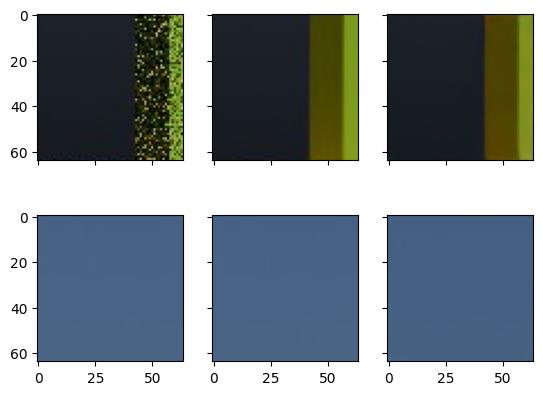

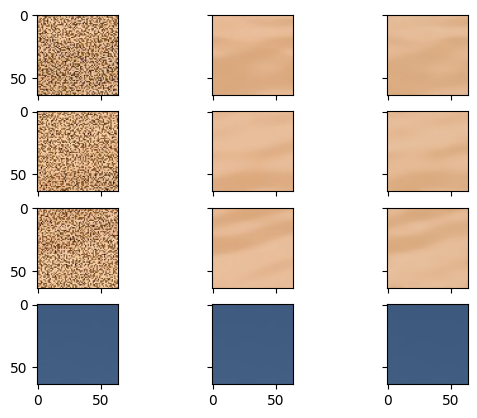

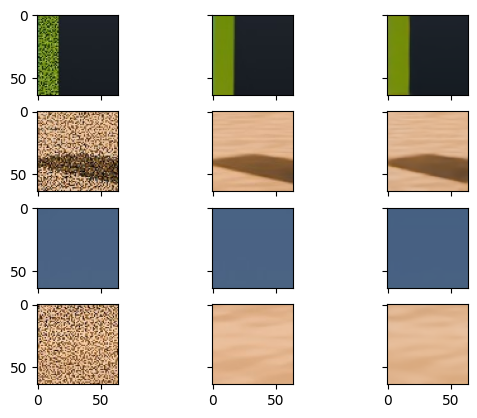

In [251]:
display(19,2,x,y,out)

# display(10,2,x,y,out2)

display(55,4,x,y,out)

# display(12,4,x,y,out2)

display(2,4,x,y,out)

In [209]:
class Denoiser:

  def __init__(self,model):

    self.model=model

    self.patch_shape=model.image_shape

  def denoise(self,image):

    return image

In [210]:
class GridDenoiser(Denoiser):

  def __init__(self,model):

    super().__init__(model)

  def denoise(self,image):
    x=np.array(image)
    # print(((0,self.patch_shape[0]-x.shape[0]%self.patch_shape[0]),(0,self.patch_shape[1]-x.shape[1]%self.patch_shape[1])))
    x=np.pad(x,((0,self.patch_shape[0]-x.shape[0]%self.patch_shape[0]),(0,self.patch_shape[1]-x.shape[1]%self.patch_shape[1]),(0,0)))

    out=np.zeros((x.shape[0],x.shape[1],x.shape[2]))

    patches=np.zeros(((x.shape[0]//64)*(x.shape[1]//64),)+self.patch_shape)

    print(patches.shape)

    for i in np.arange(0,math.floor(x.shape[0]/self.patch_shape[0])):

      for j in np.arange(0,math.floor(x.shape[1]/self.patch_shape[1])):

        patches[i*math.floor(x.shape[1]/64)+j]=x[i*self.patch_shape[0]:(i+1)*self.patch_shape[0],j*self.patch_shape[1]:(j+1)*self.patch_shape[1],:]

    pred=self.model(patches).numpy()

    for i in np.arange(0,math.floor(x.shape[0]/self.patch_shape[0])):

      for j in np.arange(0,math.floor(x.shape[1]/self.patch_shape[1])):

        out[i*self.patch_shape[0]:(i+1)*self.patch_shape[0],j*self.patch_shape[1]:(j+1)*self.patch_shape[1],:]=pred[i*math.floor(x.shape[1]/64)+j]
    out=out[0:image.shape[0],0:image.shape[1],:]
    return out

In [211]:
class SlidingWindowDenoiser(Denoiser):

  def __init__(self,model,slide):
    self.slide=slide
    super().__init__(model)

  # def create_chunks(self,image):

  #   x=np.array(image)

  #   return image.reshape(x.shape[0]//self.patch_shape[0],-1,self.patch_shape[1]).swapaxes(1,2)

  def denoise(self,image):
    slide=self.slide
    patches_buffer_size=32


    x=np.array(image)
    x=np.pad(x,((self.patch_shape[0],2*self.patch_shape[0]-x.shape[0]%self.patch_shape[0]),(self.patch_shape[1],2*self.patch_shape[1]-x.shape[1]%self.patch_shape[1]),(0,0)))
    patches_count=((x.shape[0]-self.patch_shape[0])//slide+1,(x.shape[1]-self.patch_shape[1])//slide+1)
    out=np.zeros((x.shape[0],x.shape[1],x.shape[2]))

    patches=np.zeros((patches_buffer_size,)+self.patch_shape)

    print(patches.shape)

    # return

    patchindex=0

    for i in np.arange(0,patches_count[0]):

      for j in np.arange(0,patches_count[1]):

        patches[patchindex%patches_buffer_size]=x[i*slide:i*slide+self.patch_shape[0],j*slide:j*slide+self.patch_shape[1],:]

        patchindex=patchindex+1



        if (patchindex!=0 and patchindex%patches_buffer_size==0) or (i==patches_count[0]-1 and j==patches_count[1]-1) :

          pred=self.model(patches).numpy()

          for k in np.arange(0,np.min((patches_buffer_size,patchindex))):

              basei=patchindex-np.min((patches_buffer_size,patchindex))

              top_left=((basei+k)//patches_count[1]*slide,(basei+k)%patches_count[1]*slide)

              # print(top_left)

              val=pred[k]

              # print(k,patchindex,basei)

              out[top_left[0]:top_left[0]+self.patch_shape[0],top_left[1]:top_left[1]+self.patch_shape[1],:]+=val



    # pred=patches



        # out[i:i+model.input_shape[1],j:j+model.input_shape[2],:]=x[i:i+model.input_shape[1],j:j+model.input_shape[2],:]

    out=out/(self.patch_shape[0]/slide)/(self.patch_shape[1]/slide)
    out=out[self.patch_shape[0]:self.patch_shape[0]+image.shape[0],self.patch_shape[1]:self.patch_shape[1]+image.shape[1],:]
    return out

In [212]:


def denoise(model,img):

  # img=Image.fromarray((x[0]*255.0).astype('uint8'))

  x=np.array(img)

  out=np.zeros((x.shape[0],x.shape[1],x.shape[2]))

  print(out.shape)

  for i in np.arange(0,math.floor(x.shape[0]/64)*64,model.image_shape[0]):

    for j in np.arange(0,math.floor(x.shape[1]/64)*64,model.image_shape[1]):

      out[i:i+model.image_shape[0],j:j+model.image_shape[1],:]=model(np.array((x[i:i+model.image_shape[0],j:j+model.image_shape[1],:],))).numpy()[0]

  return out

# ll=Image.open("dataset2/noise/img"+str(2)+".jpg")

# test=PIL_to_data(np.array(ll))

# Image.fromarray(data_to_PIL(denoise(model1,test)))

(289, 64, 64, 3)


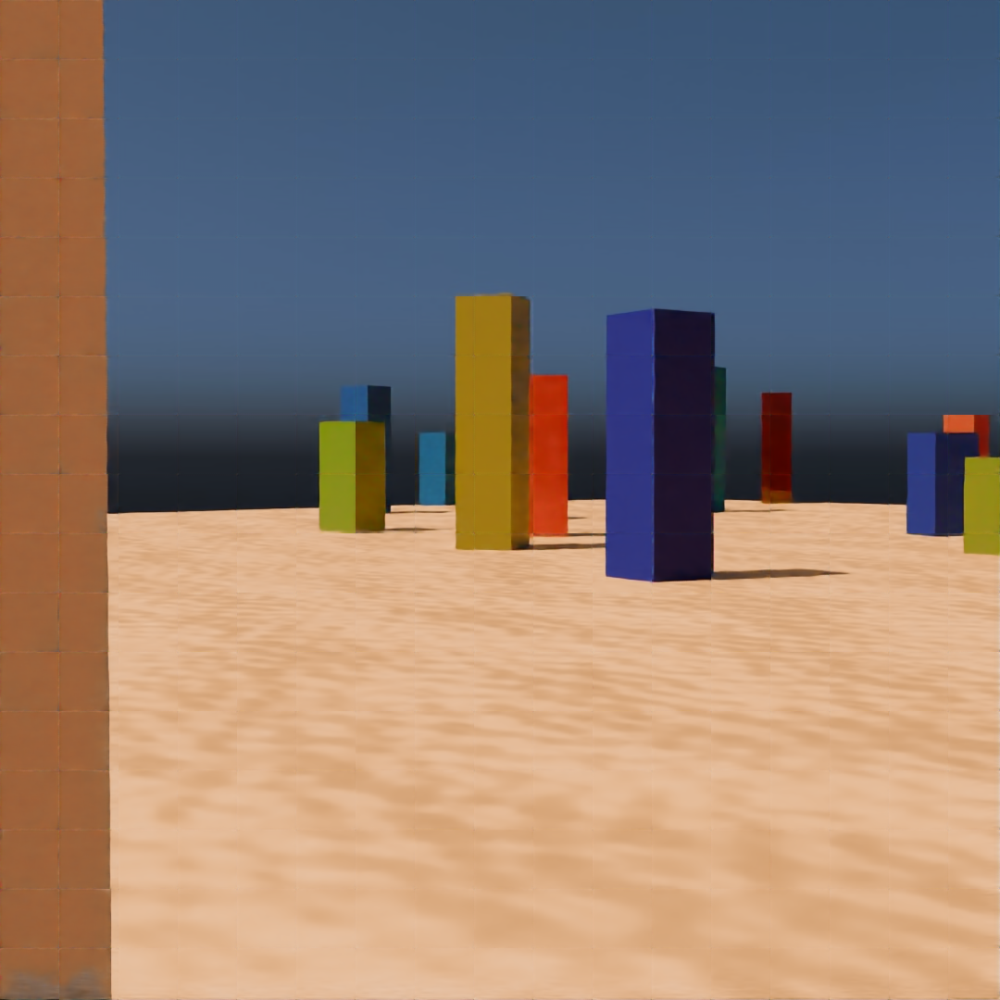

In [257]:
denoiser=GridDenoiser(model1)

testi=10

ll=Image.open(data_dir+"dataset2/noise/img"+str(testi)+".jpg")

test=PIL_to_data(np.array(ll))

p=denoiser.denoise(test)



Image.fromarray(data_to_PIL(p))


(32, 64, 64, 3)


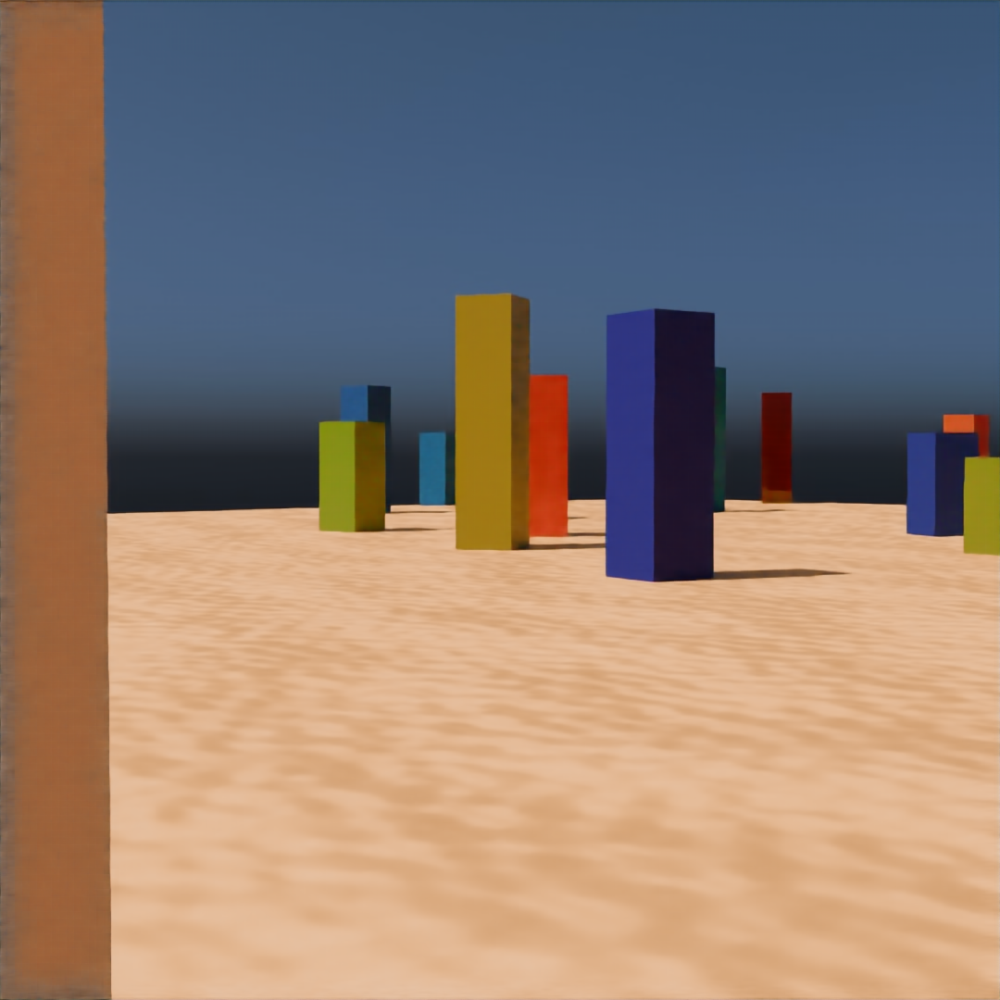

In [258]:
denoiser=SlidingWindowDenoiser(model1,8)

# testi=20

ll=Image.open(data_dir+"dataset2/noise/img"+str(testi)+".jpg")

test=PIL_to_data(np.array(ll))

p=denoiser.denoise(test)



Image.fromarray(data_to_PIL(p))

(32, 64, 64, 3)
(32, 64, 64, 3)


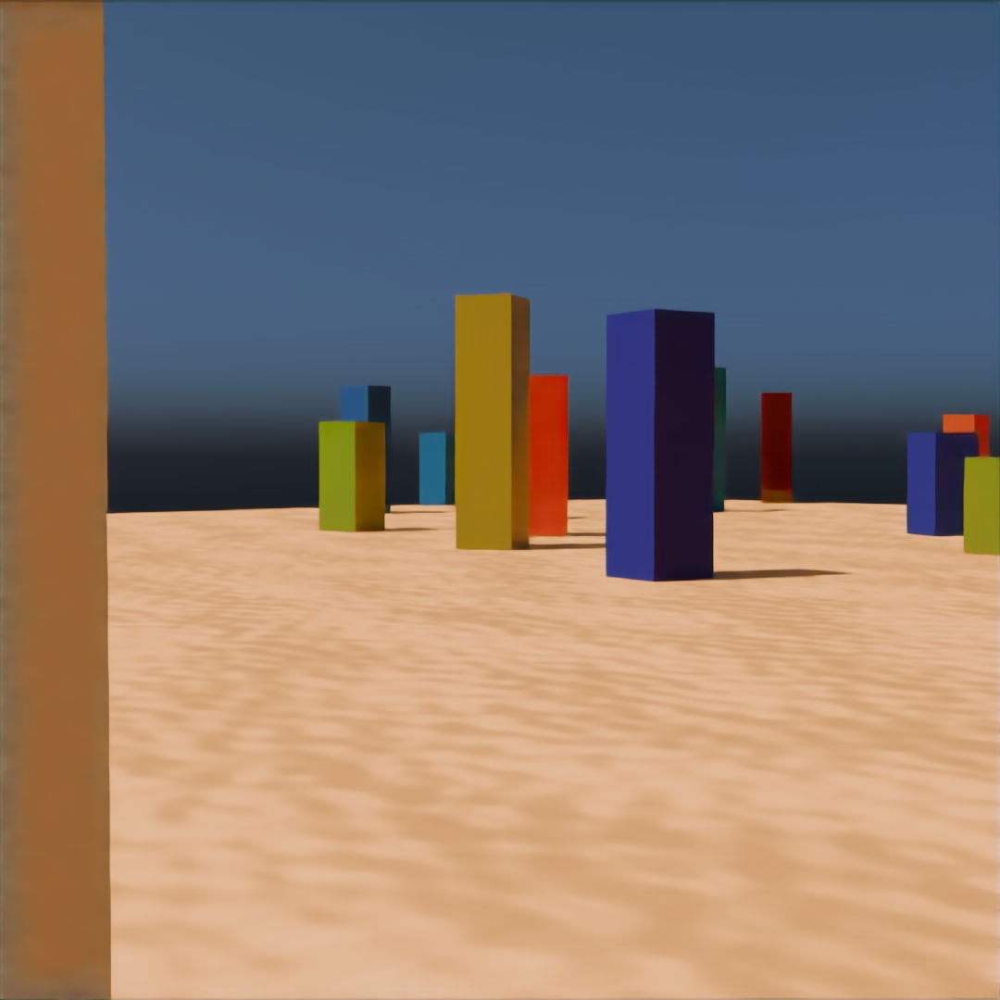

In [259]:
Image.fromarray(data_to_PIL(denoiser.denoise(denoiser.denoise(test))))

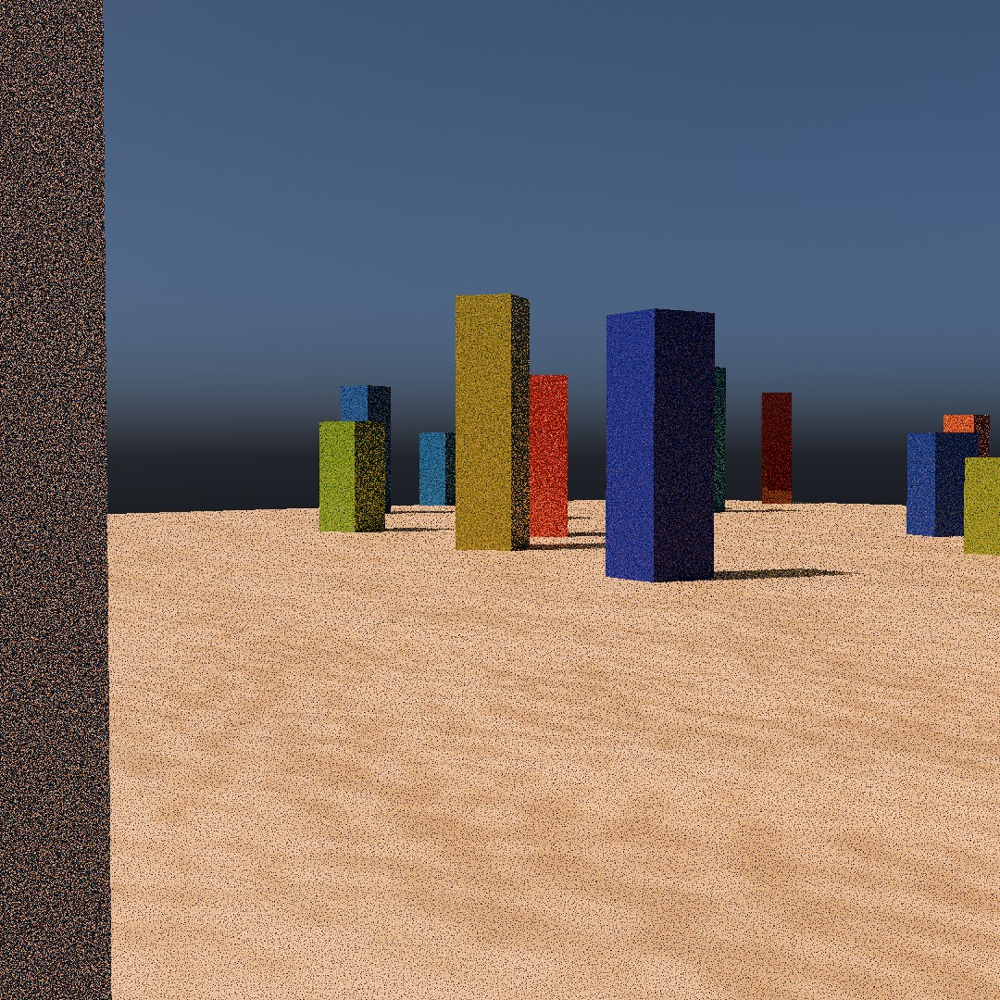

In [260]:
Image.open(data_dir+"dataset2/noise/img"+str(testi)+".jpg")

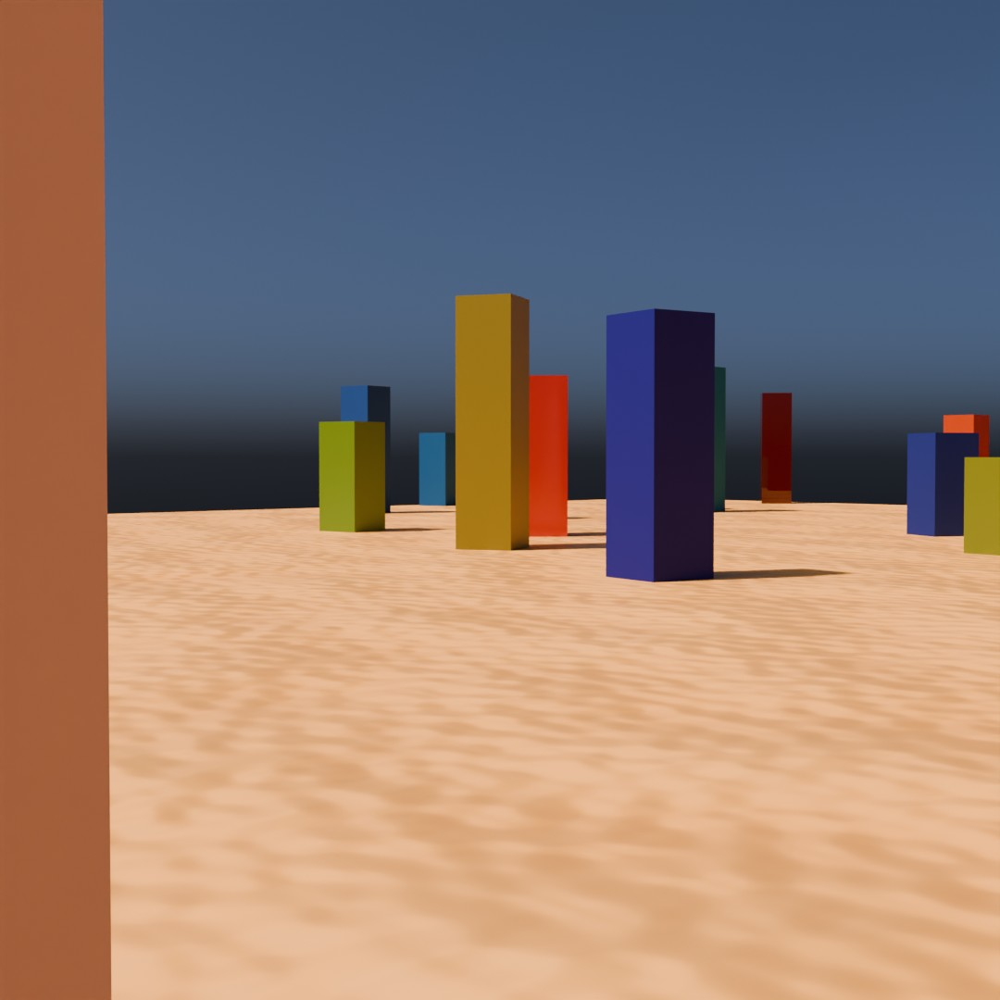

In [261]:
Image.open(data_dir+"dataset2/denoise/img"+str(testi)+".jpg")

In [178]:
# !wget "https://i.sstatic.net/S9T42.png"

--2024-11-13 20:14:50--  https://i.sstatic.net/S9T42.png
Resolving i.sstatic.net (i.sstatic.net)... 172.64.146.223, 104.18.41.33
Connecting to i.sstatic.net (i.sstatic.net)|172.64.146.223|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 587546 (574K) [image/png]
Saving to: 'S9T42.png'

S9T42.png           100%[===================>] 573.78K  --.-KB/s    in 0.07s   

2024-11-13 20:14:50 (8.59 MB/s) - 'S9T42.png' saved [587546/587546]



(32, 64, 64, 3)


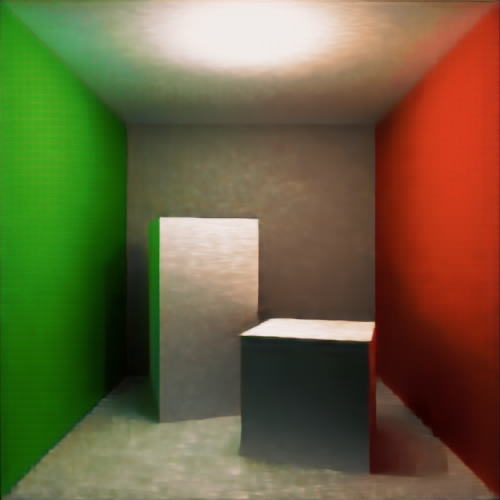

In [262]:
ll=Image.open("S9T42.png")

test=PIL_to_data(np.array(ll))

p=denoiser.denoise(test)
Image.fromarray(data_to_PIL(p))